# UNDERSTANDING THE PROBLEM STATEMENT AND BUSINESS CASE


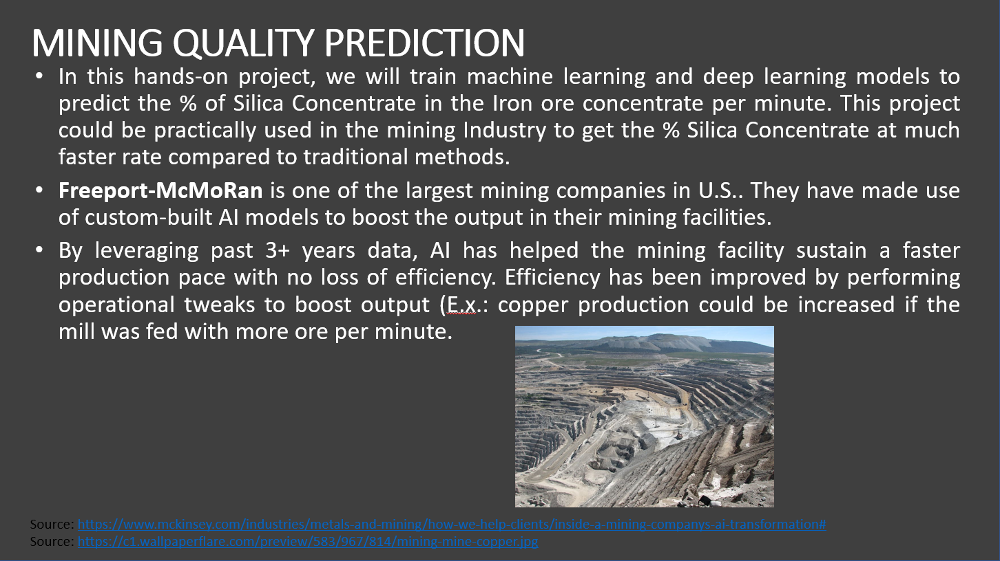

# IMPORTING LIBRARIES/DATASETS AND PERFORM DATA EXPLORATION 

In [48]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import zipfile
from jupyterthemes import jtplot
jtplot.style(theme='monokai', context='notebook', ticks=True, grid=False) 


In [49]:
mining_df=pd.read_csv('mining_data.csv')
mining_df.tail()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
245695,49.75,23.2,2961.490000,452.658667,381.784667,9.615990,1.654507,300.351000,295.703667,298.312667,...,321.464444,404.055667,523.933667,880.286833,331.448333,500.245000,424.037667,400.798000,64.27,1.71
245696,49.75,23.2,2851.376667,470.843333,384.250000,9.617760,1.654413,299.978667,304.478333,301.176667,...,335.351222,417.104667,548.184333,883.347000,388.821000,482.577333,338.373000,371.803333,64.27,1.71
245697,49.75,23.2,2729.876667,463.040667,383.073667,9.619523,1.654070,302.416667,299.060000,299.929000,...,291.529000,386.853000,546.765000,870.141667,435.600333,488.983667,420.578667,366.426333,64.27,1.71
245698,49.75,23.2,2698.756667,460.303667,384.490667,9.620873,1.653653,302.603000,299.953333,299.483667,...,285.945000,395.502667,443.776333,872.247333,416.832667,495.943333,437.163000,417.842667,64.27,1.71
245699,49.75,23.2,1673.480000,486.685000,384.424333,9.616857,1.653240,302.189000,300.740333,298.719000,...,280.703000,409.253333,460.097000,875.170667,401.933000,501.938333,350.411000,436.092667,64.27,1.71


In [50]:
mining_df.dtypes

% Iron Feed                     float64
% Silica Feed                   float64
Starch Flow                     float64
Amina Flow                      float64
Ore Pulp Flow                   float64
Ore Pulp pH                     float64
Ore Pulp Density                float64
Flotation Column 01 Air Flow    float64
Flotation Column 02 Air Flow    float64
Flotation Column 03 Air Flow    float64
Flotation Column 04 Air Flow    float64
Flotation Column 05 Air Flow    float64
Flotation Column 06 Air Flow    float64
Flotation Column 07 Air Flow    float64
Flotation Column 01 Level       float64
Flotation Column 02 Level       float64
Flotation Column 03 Level       float64
Flotation Column 04 Level       float64
Flotation Column 05 Level       float64
Flotation Column 06 Level       float64
Flotation Column 07 Level       float64
% Iron Concentrate              float64
% Silica Concentrate            float64
dtype: object

In [51]:
# check the number of null elements in the dataframe
mining_df.isnull().sum()

% Iron Feed                     0
% Silica Feed                   0
Starch Flow                     0
Amina Flow                      0
Ore Pulp Flow                   0
Ore Pulp pH                     0
Ore Pulp Density                0
Flotation Column 01 Air Flow    0
Flotation Column 02 Air Flow    0
Flotation Column 03 Air Flow    0
Flotation Column 04 Air Flow    0
Flotation Column 05 Air Flow    0
Flotation Column 06 Air Flow    0
Flotation Column 07 Air Flow    0
Flotation Column 01 Level       0
Flotation Column 02 Level       0
Flotation Column 03 Level       0
Flotation Column 04 Level       0
Flotation Column 05 Level       0
Flotation Column 06 Level       0
Flotation Column 07 Level       0
% Iron Concentrate              0
% Silica Concentrate            0
dtype: int64


- What is the average percentage Silica concentrate?
- What is the maximum percentage Iron Concentrate?

In [52]:
#Method 1:
mining_df.describe()

#Method 2:
mean_Si= mining_df['% Silica Concentrate'].mean()
print('The avg % Silica concentrate is: ', mean_Si)

max_Ir=mining_df['% Iron Concentrate'].max()
print('The max % Iron concentrate is: ', max_Ir)


The avg % Silica concentrate is:  2.3272283272283274
The max % Iron concentrate is:  68.01


# PERFORMING DATA VISUALIZATION

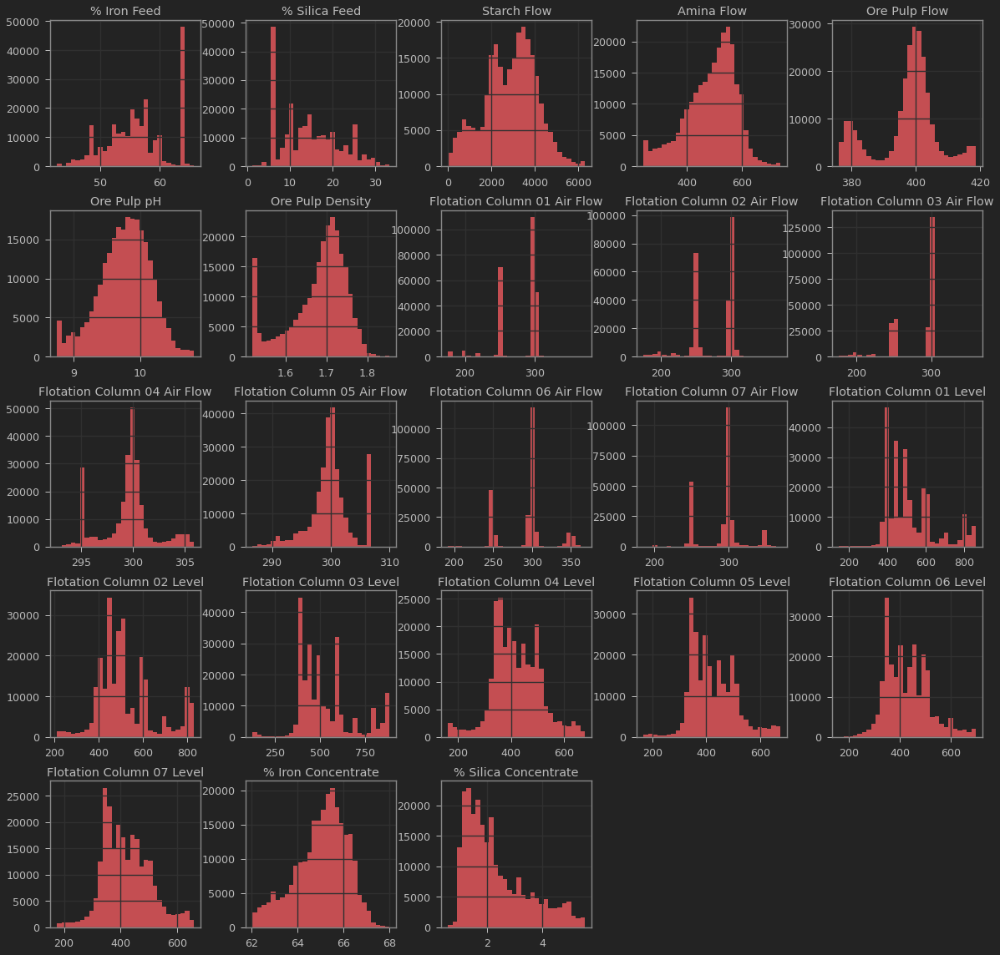

In [53]:
mining_df.hist(bins= 30, figsize= (20,20), color = 'r')
plt.show()

In [54]:
# Obtain the correlation matrix
mining_df.corr()

,% Iron Feed,% Silica Feed,Starch Flow,Amina Flow,Ore Pulp Flow,Ore Pulp pH,Ore Pulp Density,Flotation Column 01 Air Flow,Flotation Column 02 Air Flow,Flotation Column 03 Air Flow,...,Flotation Column 07 Air Flow,Flotation Column 01 Level,Flotation Column 02 Level,Flotation Column 03 Level,Flotation Column 04 Level,Flotation Column 05 Level,Flotation Column 06 Level,Flotation Column 07 Level,% Iron Concentrate,% Silica Concentrate
% Iron Feed,1.000000,-0.971837,0.028644,-0.088595,0.164676,0.007496,-0.125583,-0.062448,-0.170716,-0.062318,...,-0.016722,0.029619,0.020928,0.015189,0.016346,0.023571,0.003910,0.026100,0.055526,-0.077108
% Silica Feed,-0.971837,1.000000,-0.016489,0.079065,-0.154508,0.007953,0.104567,0.091833,0.183953,0.084325,...,0.046193,-0.038417,-0.037113,-0.022653,-0.034534,-0.044270,-0.020568,-0.047079,-0.044292,0.072778
Starch Flow,0.028644,-0.016489,1.000000,0.261934,0.044926,0.269135,0.231530,0.195538,0.192244,0.187602,...,0.202817,-0.302567,-0.286336,-0.309177,-0.013037,-0.057417,-0.077105,-0.039584,0.071303,-0.068008
Amina Flow,-0.088595,0.079065,0.261934,1.000000,0.219162,0.124254,0.659461,0.111994,0.124490,0.102632,...,0.081561,-0.270753,-0.236452,-0.288484,-0.183739,-0.215334,-0.209496,-0.171384,-0.111045,0.157644
Ore Pulp Flow,0.164676,-0.154508,0.044926,0.219162,1.000000,0.121256,0.012571,-0.141215,-0.122322,-0.144232,...,-0.146904,-0.008877,-0.008335,-0.055890,-0.010212,0.002158,-0.018051,0.017185,0.085098,0.008519
Ore Pulp pH,0.007496,0.007953,0.269135,0.124254,0.121256,1.000000,0.115073,0.163433,0.146264,0.193887,...,0.178322,-0.166525,-0.154391,-0.140251,0.046933,0.013095,-0.079157,0.019193,0.192705,-0.147550
Ore Pulp Density,-0.125583,0.104567,0.231530,0.659461,0.012571,0.115073,1.000000,-0.004695,0.026413,-0.031237,...,-0.052655,-0.112201,-0.093542,-0.149823,-0.089066,-0.142675,-0.105346,-0.087454,0.015116,0.047413
Flotation Column 01 Air Flow,-0.062448,0.091833,0.195538,0.111994,-0.141215,0.163433,-0.004695,1.000000,0.854298,0.955256,...,0.658199,-0.443870,-0.428294,-0.372533,-0.062665,-0.092254,-0.125196,-0.112074,0.099239,-0.219698
Flotation Column 02 Air Flow,-0.170716,0.183953,0.192244,0.124490,-0.122322,0.146264,0.026413,0.854298,1.000000,0.866927,...,0.592888,-0.437313,-0.428303,-0.368913,-0.075833,-0.112465,-0.124478,-0.114693,0.059709,-0.169029
Flotation Column 03 Air Flow,-0.062318,0.084325,0.187602,0.102632,-0.144232,0.193887,-0.031237,0.955256,0.866927,1.000000,...,0.661261,-0.443454,-0.423836,-0.365800,-0.047216,-0.064355,-0.105673,-0.086448,0.100888,-0.219593


<AxesSubplot:>

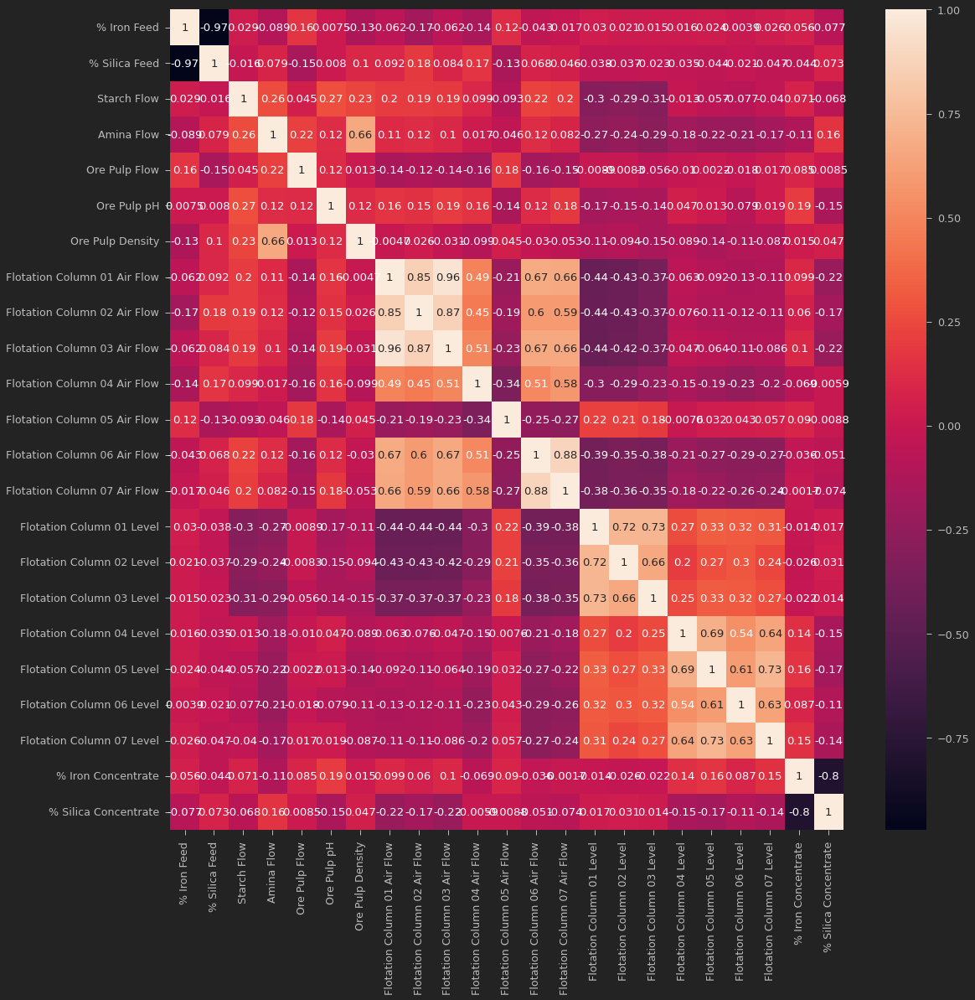

In [55]:
plt.figure(figsize=(18,18))
sns.heatmap(mining_df.corr(),annot=True)
# From this pair plot, we can infer that there is a relationship between iron feed and silica feed 
# Also, a relationship between silica concentrate and iron concentrate.

After analysing the heatmap before, we can plot some correlations to check them:

- Plot the scatterplot between % Silica Concentrate and Iron Concentrate
- Plot the scatterplot between % Iron Feed and % Silica Feed 



In [56]:
import plotly.express as px

fig1 = px.scatter(mining_df, x='% Silica Concentrate', y='% Iron Concentrate', color='% Silica Concentrate')
                 #size='Flotation Column 06 Level') #hover_data=['Flotation Column 06 Level'])
fig1.show()

#fig2 = px.scatter(mining_df, x='% Iron Feed', y='% Silica Feed')
#fig2.show()




/home/yesica/Documents/Courses/Data_Science/venv/lib/python3.10/site-packages/seaborn/_decorators.py:36: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



<AxesSubplot:xlabel='% Iron Feed', ylabel='% Silica Feed'>

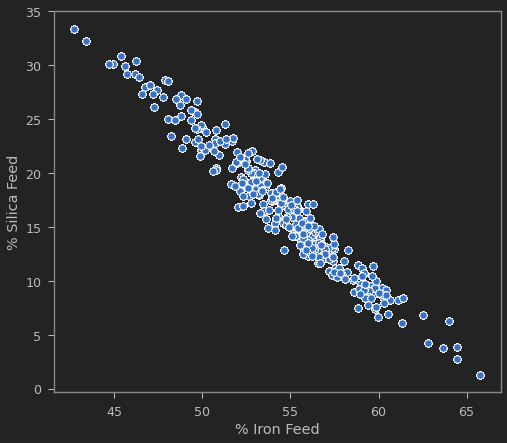

In [57]:
#Scatterplot with Seaborn

sns.scatterplot(mining_df['% Iron Feed'], mining_df['% Silica Feed'])

# PREPARING THE DATA BEFORE MODEL TRAINING

In [58]:
# I will take off the '% Silica Concentrate' from the input dataframe as it will be my output or target.

df_iron = mining_df.drop(columns = '% Silica Concentrate')
df_iron_target = mining_df['% Silica Concentrate']

In [59]:
df_iron.shape

(245700, 22)

In [60]:
df_iron_target.shape

(245700,)

In [61]:
#Convert these two DF into Numpy arrays
df_iron = np.array(df_iron)
df_iron_target = np.array(df_iron_target)

In [62]:
# reshaping the target array
df_iron_target = df_iron_target.reshape(-1,1)
df_iron_target.shape

(245700, 1)

In [63]:
# Normalizing the data before feeding the model
from sklearn.preprocessing import StandardScaler, MinMaxScaler

scaler_x= StandardScaler()
X= scaler_x.fit_transform(df_iron)         #Input

scaler_y= StandardScaler()
y= scaler_y.fit_transform(df_iron_target)  #Output

In [64]:
# spliting the data into test and train sets
from cgi import test
from sklearn.model_selection import train_test_split

X_train, X_test, y_train, y_test = train_test_split(X,y,test_size= 0.2,random_state=4)

In [65]:
print("Train set: ", X_train.shape,y_train.shape)
print("Test set: ", X_test.shape,y_test.shape)

Train set:  (196560, 22) (196560, 1)
Test set:  (49140, 22) (49140, 1)


# TRAINING AND EVALUATING A LINEAR REGRESSION MODEL

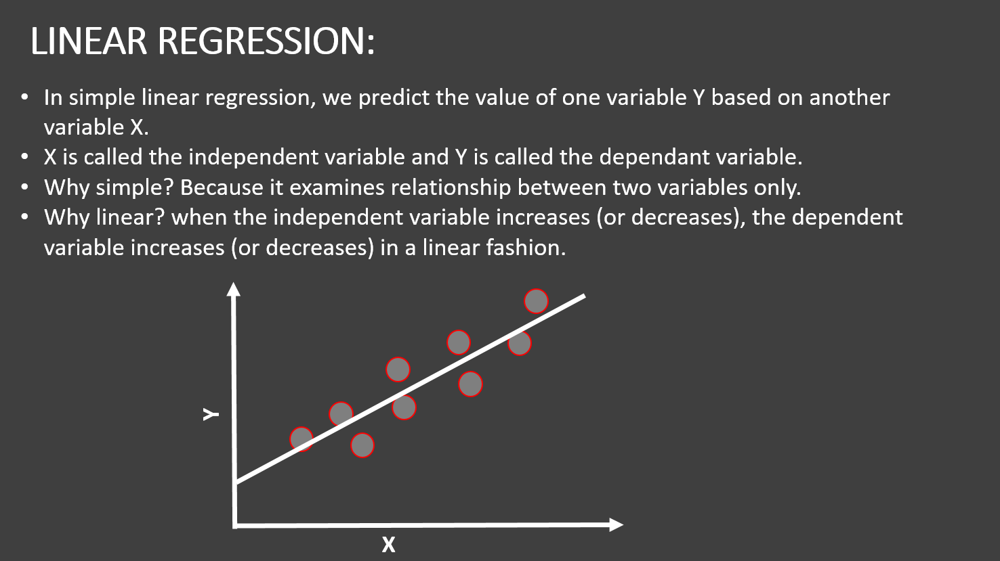

In [66]:
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, accuracy_score

LR= LinearRegression()
LR.fit (X_train,y_train)

yhat= LR.predict(X_test)
yhat[0:5]

array([[ 0.54157908],
       [-0.77190167],
       [ 1.09637649],
       [ 0.06906879],
       [-0.24938289]])

In [67]:
accuracy_LR= LR.score(X_test, y_test)
accuracy_LR

0.6811538074043539

*That accuracy seems pretty bad, so I will evaluate the training set into a Decision Tree model and see how it actually the model works with our problem.*

# TRAINING AND EVALUATING A DECISION TREE AND RANDOM FOREST MODELS

In [68]:
# Decision tree builds regression or classification models in the form of a tree structure. 
# Decision tree breaks down a dataset into smaller subsets while at the same time an associated decision tree is incrementally developed. 
# The final result is a tree with decision nodes and leaf nodes.

from sklearn.tree import DecisionTreeRegressor    #Regression because in our case, we're trying to solve a continuous variable problem.

DecTree_model= DecisionTreeRegressor()
DecTree_model=DecTree_model.fit(X_train, y_train)


In [69]:
accuracy_DecTree= DecTree_model.score(X_test, y_test)
accuracy_DecTree

0.9853472778837096

*Decision Tree Model has 0.98 of accuracy!*  \
Decision Trees are highly sensitive to the training data, one small change could produce a completelly different result, and could result in high variance. So our model might fail to generalize. Hence, we will try a Random Forest Regressor Model.

### Train a Random Forest Regressor Model with n_estimators = 100 and max_depth of 10 

Random Forest is much less sensitive to the training data then decision trees, because the algorithm works using Bootstrap + Aggregating (bagging) methods by creating several decision trees.

**Bootstrapping:** ensures that we are not using the same data for every tree, so in a way it helps our model to be less sensitive to the original training data.

**Random Feature Selection:** helps to reduce the correlation between the trees. If you use every feature then most of the trees will have the same decision nodes and they will act very similarly.

In [70]:
y_new_train= np.ravel(y_train)
y_new_train

array([-1.07249986, -0.21963728, -1.02807994, ...,  0.59768936,
       -1.4100913 ,  0.46993754])

In [71]:
from sklearn.ensemble import RandomForestRegressor
rfr= RandomForestRegressor(n_estimators=50, max_depth=10)
rfr= rfr.fit(X_train, y_new_train)

#Accuracy:
accuracy_rfr= rfr.score(X_test, y_test)
accuracy_rfr


0.8907430884115848

# ARTIFICIAL NEURAL NETWORKS

## TRAIN AN ARTIFICIAL NEURAL NETWORK TO PERFORM REGRESSION TASK

In [37]:
import tensorflow as tf
from tensorflow import keras
from keras.layers import Dense, Activation, Dropout
from keras.optimizers import Adam

optimizer = Adam(learning_rate=0.001, beta_1 = 0.9, beta_2 = 0.999, epsilon = 1e-07, amsgrad = False)
ANN_model = keras.Sequential()
ANN_model.add(Dense(250, input_dim = 22, kernel_initializer='normal',activation='relu'))
ANN_model.add(Dense(500,activation = 'relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(1000, activation = 'relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(1000, activation = 'relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(500, activation = 'relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(250, activation = 'relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(250, activation='relu'))
ANN_model.add(Dropout(0.1))
ANN_model.add(Dense(1, activation = 'linear'))
ANN_model.compile(loss = 'mse', optimizer = 'adam')
ANN_model.summary()

Model: "sequential_6"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 dense_43 (Dense)            (None, 250)               5750      
                                                                 
 dense_44 (Dense)            (None, 500)               125500    
                                                                 
 dropout_31 (Dropout)        (None, 500)               0         
                                                                 
 dense_45 (Dense)            (None, 1000)              501000    
                                                                 
 dropout_32 (Dropout)        (None, 1000)              0         
                                                                 
 dense_46 (Dense)            (None, 1000)              1001000   
                                                                 
 dropout_33 (Dropout)        (None, 1000)             

In [32]:
history = ANN_model.fit(X_train, y_train, epochs=10, validation_split=0.2)

Epoch 1/10
4914/4914 [==============================] - 86s 17ms/step - loss: 0.2078 - val_loss: 0.1623
Epoch 2/10
4914/4914 [==============================] - 86s 17ms/step - loss: 0.1432 - val_loss: 0.1206
Epoch 3/10
4914/4914 [==============================] - 87s 18ms/step - loss: 0.1200 - val_loss: 0.1027
Epoch 4/10
4914/4914 [==============================] - 86s 17ms/step - loss: 0.1043 - val_loss: 0.1039
Epoch 5/10
4914/4914 [==============================] - 85s 17ms/step - loss: 0.0951 - val_loss: 0.0789
Epoch 6/10
4914/4914 [==============================] - 93s 19ms/step - loss: 0.0873 - val_loss: 0.0746
Epoch 7/10
4914/4914 [==============================] - 100s 20ms/step - loss: 0.0825 - val_loss: 0.0681
Epoch 8/10
4914/4914 [==============================] - 93s 19ms/step - loss: 0.0773 - val_loss: 0.0659
Epoch 9/10
4914/4914 [==============================] - 95s 19ms/step - loss: 0.0741 - val_loss: 0.0828
Epoch 10/10
4914/4914 [==============================] - 89s 18

In [33]:
result = ANN_model.evaluate(X_test, y_test)
accuracy_ANN = 1 - result
print("Accuracy : {}".format(accuracy_ANN))

1536/1536 [==============================] - 10s 7ms/step - loss: 0.0627
Accuracy : 0.9372943937778473


In [34]:
history.history.keys()

dict_keys(['loss', 'val_loss'])

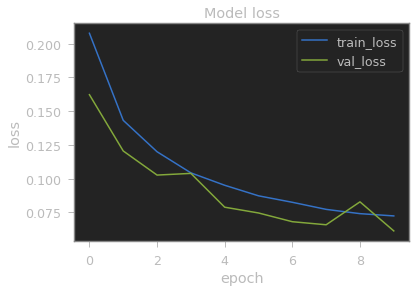

In [35]:
plt.plot(history.history['loss'])
plt.plot(history.history['val_loss'])
plt.title('Model loss')
plt.ylabel('loss')
plt.xlabel('epoch')
plt.legend(['train_loss','val_loss'], loc = 'upper right')
plt.show()

# COMPARE MODELS AND CALCULATE REGRESSION KPIs 


In [ ]:
# From the above results, it can be seen that, decision tree model out-performs the other models.

Text(0, 0.5, 'True Values')

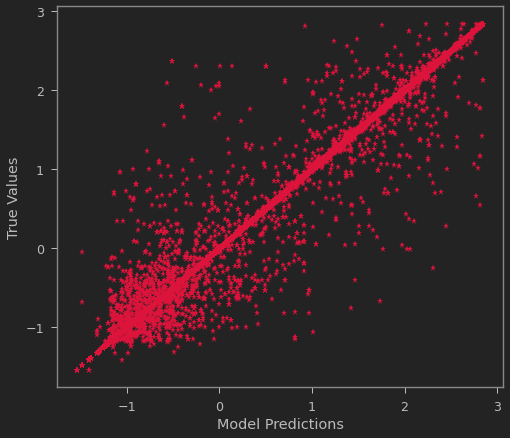

In [72]:
yhat = DecTree_model.predict(X_test)
plt.plot(yhat, y_test,'*', color= '#DC143C')
plt.xlabel('Model Predictions')
plt.ylabel('True Values')


Text(0, 0.5, 'True Values')

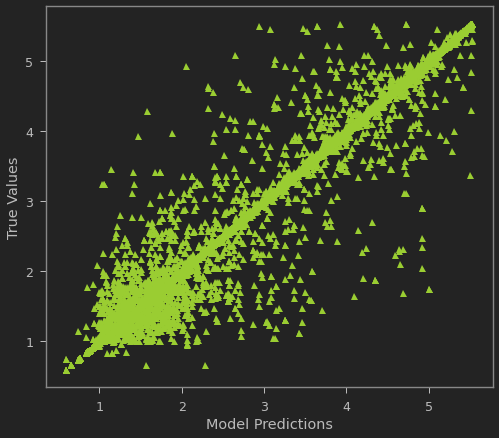

In [80]:
# I'm going to perform an inverse transform to go back to the original dataset labels values
yhat= yhat.reshape(-1,1)

y_predict_orig = scaler_y.inverse_transform(yhat)
y_test_orig = scaler_y.inverse_transform(y_test)
plt.plot(y_test_orig, y_predict_orig, "^", color = '#9ACD32')
plt.xlabel('Model Predictions')
plt.ylabel('True Values')

In [81]:
from sklearn.metrics import r2_score, mean_squared_error, mean_absolute_error
from math import sqrt

k = X_test.shape[1]
n = len(X_test)
RMSE = float(format(np.sqrt(mean_squared_error(y_test_orig, y_predict_orig)),'.3f'))
MSE = mean_squared_error(y_test_orig, y_predict_orig)
MAE = mean_absolute_error(y_test_orig, y_predict_orig)
r2 = r2_score(y_test_orig, y_predict_orig)
adj_r2 = 1-(1-r2)*(n-1)/(n-k-1)

print('RMSE =',RMSE, '\nMSE =',MSE, '\nMAE =',MAE, '\nR2 =', r2, '\nAdjusted R2 =', adj_r2) 

RMSE = 0.136 
MSE = 0.018513557754374802 
MAE = 0.01976272831332372 
R2 = 0.9853472778837096 
Adjusted R2 = 0.985340714781595


*The KPIs results show that R2 is 0.985, which means that 98,5% of the variation in the output are being explained by the variation in the input and that is really good. Others KPIs are pretty high which make sense with the result of R2.*

## That's all for this case of study. Maybe we can try to take the Artificial Neural Network and try to tackle the Decision Tree Model by finding the ANN's best parameters (like increasing the epoch)

https://www.forbes.com/sites/bernardmarr/2018/09/07/the-4th-industrial-revolution-how-mining-companies-are-using-ai-machine-learning-and-robots/#fcde6c6497e5